`Src: paper_figures_v01p5.ipynb`

## Initialization

In [1]:
%reload_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

import numpy as np
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
from astropy.io import fits
from pprint import pprint
from tqdm import tqdm
import pickle
import corner
import os

from scipy import optimize
from scipy.stats import poisson

import jax
import jax.numpy as jnp

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc_file('../utils/matplotlibrc')

from utils import ed_fcts_amarel as ef
from utils import create_mask as cm
from utils import ed_plotting as eplt

# load GPU
gpu_id = '1'
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_id

/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# standard settings
nside = 128
ebin = 10
temp_names_sim = ['iso', 'psc', 'bub', 'pib', 'ics', 'blg', 'nfw']
n_pixels = 160 # no longer can control this since we load cartesian maps beforehand

# label best models (dif_names ordered from 0 - 79)
roman_nums_arr = [ef.int_to_Roman(i) for i in range(1,80+1)]
best_models_rom = ['X', 'XV', 'XLVIII', 'XLIX', 'LIII']
model_names = ['O'] + best_models_rom
best_models = [roman_nums_arr.index(r) + 1 for r in best_models_rom]

# control speed by modifying resolution of healpix plots
xsize = 2000 # 2000 is our best choice (but slow)

# load masks
mask_p, mask, outer_mask, total_mask, mask_40 = pickle.load(open('data/masks.p', 'rb'))

## Figures 1 - 3
### Figure 1
#### Top

In [3]:
# load data
data, temp_dict = pickle.load(open('data/figdata_1_3.p', 'rb'))

/tmp/ipykernel_3921679/853866318.py:3: RuntimeWarning: divide by zero encountered in log10
  eplt.allsky_map(m = np.log10(data), title = 'Data', vmin = 0, vmax = 4.5)


<Figure size 1440x720 with 0 Axes>

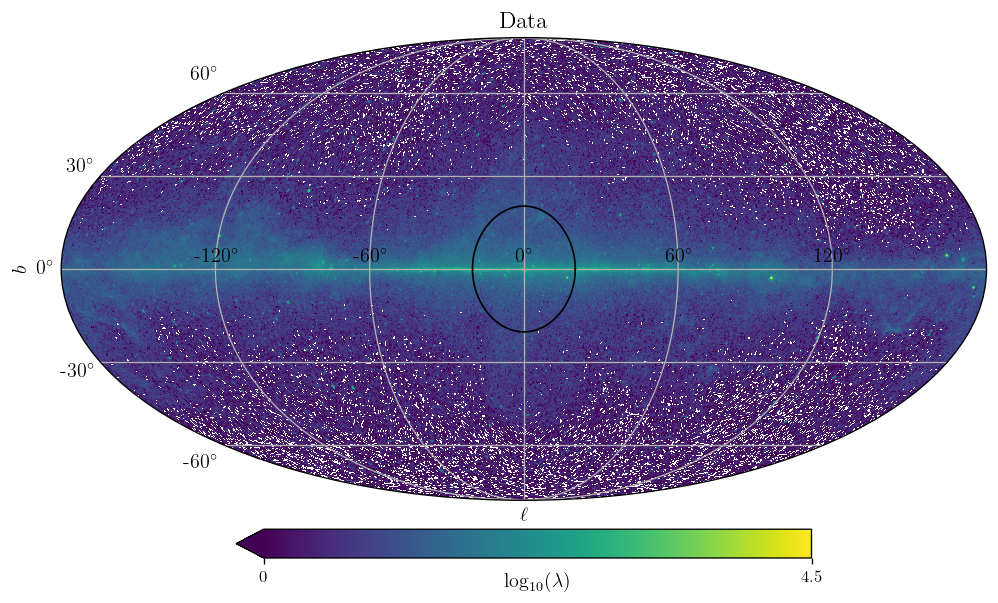

In [4]:
# Top Plot: Data
fig = plt.figure(figsize=(12,6), dpi= 120)
eplt.allsky_map(m = np.log10(data), title = 'Data', vmin = 0, vmax = 4.5)
plt.savefig('figures/fig_allsky_data.svg', bbox_inches='tight')

#### Bottom

/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

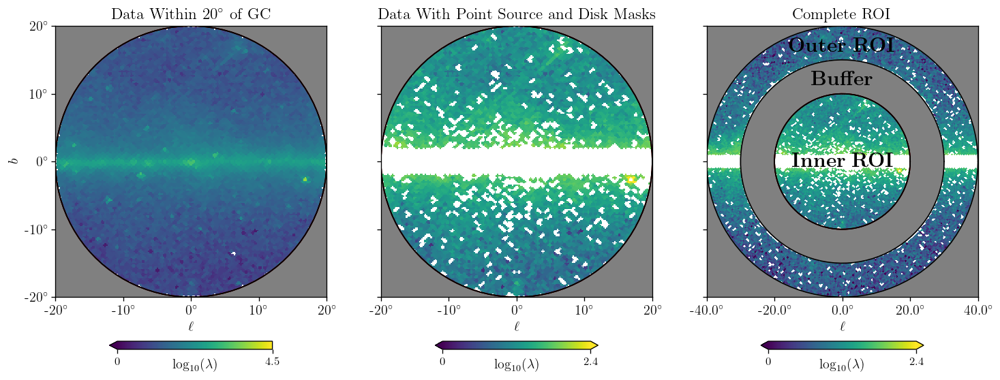

In [5]:
# Bottom: Data Processing 
fig, axes = plt.subplots(figsize=(12, 6), dpi= 120, nrows = 1, ncols = 3) # DEFINING AXES FROM HERE DOES NOT WORK SEE SUBPLOT ARGUMENT BELOW

# Inner ROI, No Masking 
inner_mask = mask
m = ef.convert_masked_array_to_hp_array(data[~inner_mask], inner_mask, log_option = True, nside=nside)
plt.axes(axes[0])
eplt.inner_roi_map(m, title = 'Data Within 20$^{\circ}$ of GC', vmin = 0, vmax = 4.5, subplot = 131)

# Inner ROI, w Masking
m = ef.convert_masked_array_to_hp_array(data[~mask_p], mask_p, log_option = True, nside=nside)
plt.axes(axes[1])
eplt.inner_roi_map(m, title = 'Data With Point Source and Disk Masks', vmin = 0, vmax = 2.4, subplot = 132, display_y_info = False)

# Complete ROI, w Masking
m = ef.convert_masked_array_to_hp_array(data[~total_mask], total_mask, log_option = True, nside=nside)
plt.axes(axes[2])
eplt.complete_roi_map(m, title = 'Complete ROI', vmin = 0, vmax = 2.4, subplot = 133, display_y_info = False)

plt.savefig('figures/fig_roi_steps.svg', bbox_inches='tight')

### Figure 2

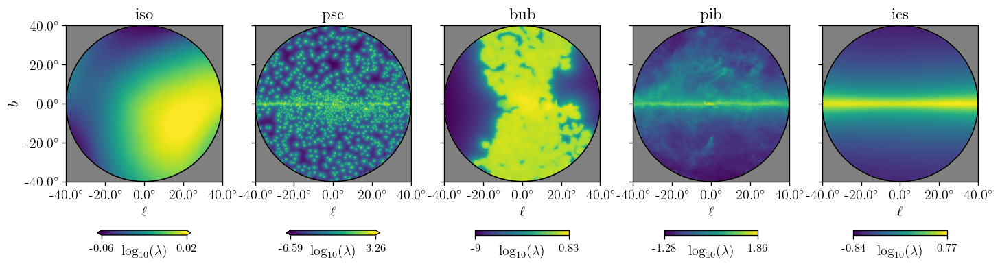

In [6]:
ordered_known_templates = ['iso', 'psc', 'bub', 'pib', 'ics']

fig, axes = plt.subplots(figsize=(12, 6), dpi= 120, nrows = 1, ncols = 5) 
for n in range(len(ordered_known_templates)):
    name = ordered_known_templates[n]
    m = ef.convert_masked_array_to_hp_array(temp_dict[name], mask_40, log_option = True, nside = 128)
    plt.axes(axes[n])
    eplt.outer_roi_map(m, title = name, vmin = np.round(m.min(),2), vmax = np.round(m.max(),2), subplot = int(str(1) + str(5) + str(n + 1)), 
    display_y_info = False if n != 0 else True)
plt.tight_layout(pad = 0.1)
fig.savefig('figures/fig_templates_known.pdf', bbox_inches='tight')

### Figure 3

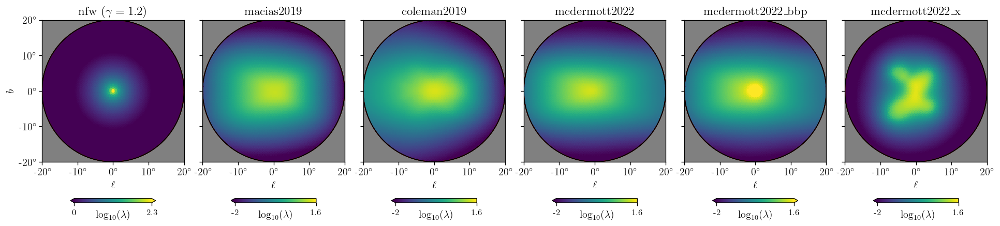

In [7]:
fig, axes = plt.subplots(figsize=(16, 6), dpi= 120, nrows = 1, ncols = 6) 

n = 0
m = ef.convert_masked_array_to_hp_array(temp_dict['nfw'], mask_40, log_option = True, nside = 128)
plt.axes(axes[0])
eplt.inner_roi_map(m, title = 'nfw ($\\gamma = 1.2$)', vmin = 0., vmax = 2.3, subplot = int(str(1) + str(6) + str(n + 1)), 
display_y_info = False if n != 0 else True)

for n in range(len(temp_dict['blg'])):
    name = ef.gen_blg_name_(n)[0]
    m = ef.convert_masked_array_to_hp_array(temp_dict['blg'][n], mask_40, log_option = True, nside = 128)
    plt.axes(axes[1 + n])
    eplt.inner_roi_map(m, title = name, vmin = -2., vmax = 1.6, subplot = int(str(1) + str(6) + str(n + 2)), 
    display_y_info = False)
plt.tight_layout(pad = 0.2)
fig.savefig('figures/fig_templates_gce.pdf', bbox_inches='tight')

## Figures 4 - 6
### Figure 4

In [8]:
# load data
data, corner_samples, temp_sample_dict, temp_sample_dict_cmask, temp_dict = pickle.load(open('data/figdata_4_6.p', 'rb'))

# load cartesian data
mask_map_cart, exp_gp_samples_cart, gp_true, tot_samples_cart, sim_samples, model_residuals_cart, data_residuals_cart = pickle.load(open('data/figdata_4_6_cart.p', 'rb'))

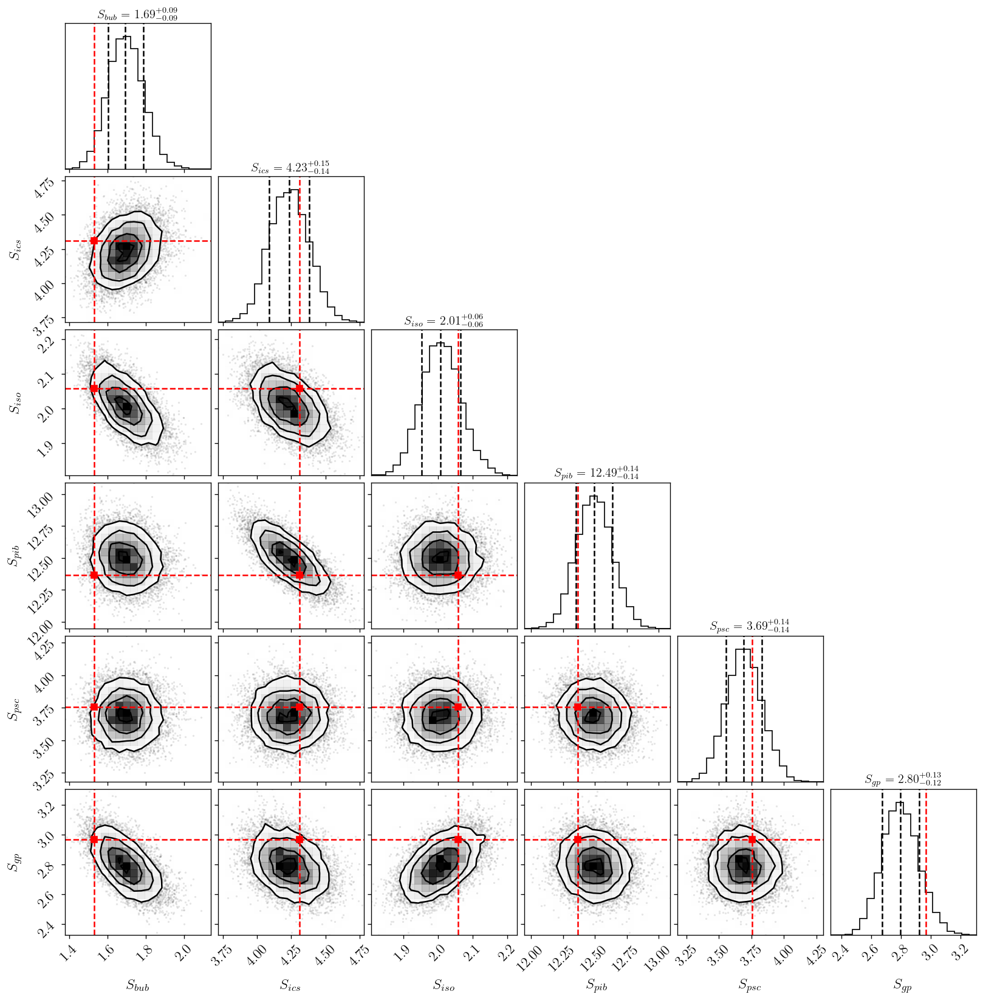

In [9]:
# generate corner plots
names = list(corner_samples.keys())
labels = ef.gen_labels(names)
fig = ef.make_corner_plots(corner_samples, with_mean_vlines = False, sim_vlines = True, temp_dict = temp_dict, labels = labels)
fig.savefig('figures/fig_sim_corner_plot.svg', bbox_inches='tight')

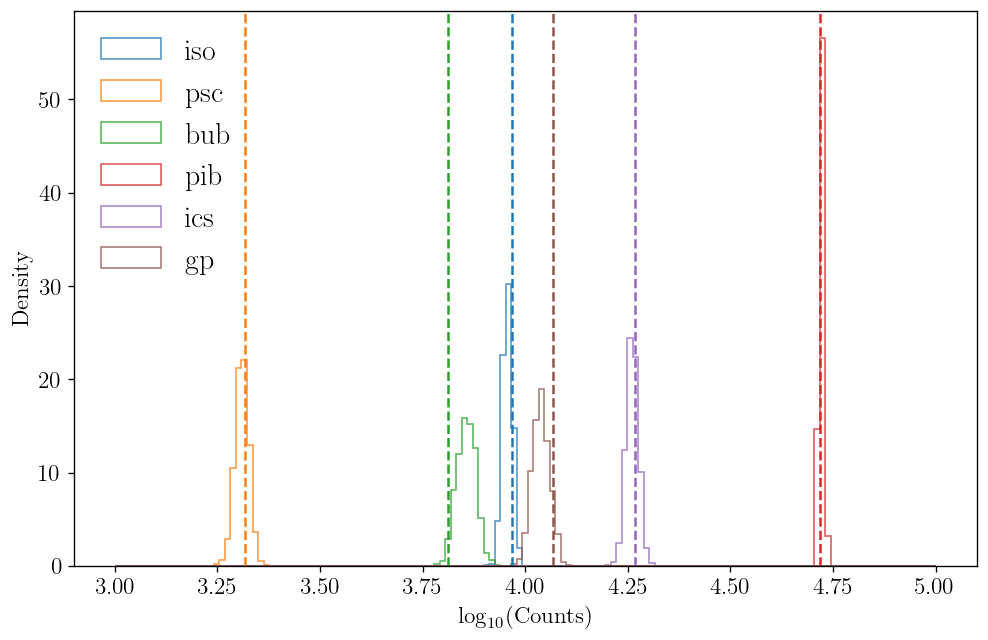

In [10]:
# generate samples and plot histograms of log counts
fig = plt.figure(figsize=(6 * 1.618, 6), dpi= 120) ; ax = fig.add_subplot(111)
ef.tot_log_counts_hist(temp_sample_dict, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = ax)
fig.savefig('figures/fig_sim_log_counts_hist.svg', bbox_inches='tight')

### Figure 5

Slice at y = 3.37500 deg
Slice at y = 3.37500 deg


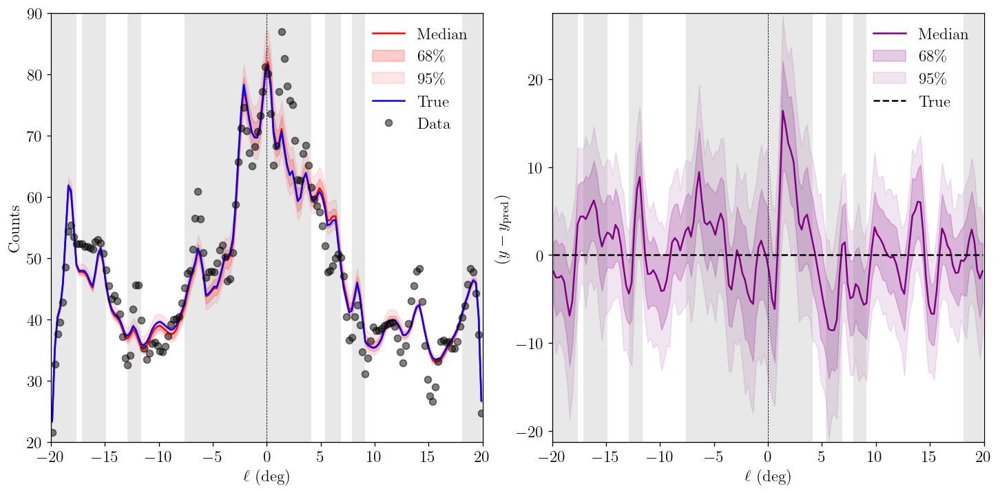

In [11]:
slice_val = 3.2  # y-value of slice

fig, axes = plt.subplots(figsize=(12, 6 - 0.125), dpi= 120, nrows = 1, ncols = 2)

# 1d slice of total rate map
q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)
sim_cart = ef.healpix_to_cart(sim_samples, mask, n_pixels = n_pixels, nside = 128)
raw_cart = ef.healpix_to_cart(data[~mask], mask, n_pixels = n_pixels, nside = 128)

plt.axes(axes[0])
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_val = slice_val, 
    ylim = [20., 90.],
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,)

# 1d slice of total rate residuals
q = np.percentile(data_residuals_cart, [2.5,16,50,84,97.5], axis = 0)
sim_cart = np.zeros((n_pixels,n_pixels))
raw_cart = None

plt.axes(axes[1])
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$(y - y_\mathrm{pred})$', q_color = 'purple', line_color = 'k', ls = '--')

fig.tight_layout(pad = 0.2)
fig.savefig('figures/fig_sim_tot_slice.pdf', bbox_inches='tight')

### Figure 6

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

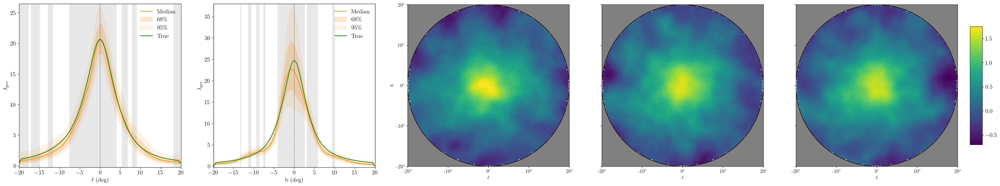

In [12]:
slice_val = 3.2  # y-value of slice

n_subplots = 5 
vmin = -0.7 ; vmax = 1.75

# gridspec = {'width_ratios': [1, 1, 1, 1, 1, 0.1]}
fig, axes = plt.subplots(figsize=(8.15*n_subplots, 6), dpi= 120, nrows = 1, ncols = n_subplots)

# 1d slice of GCE
q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
sim_cart = ef.healpix_to_cart(gp_true, mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
raw_cart = None

plt.axes(axes[0], aspect = 'equal')
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_dir = 'horizontal', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

plt.axes(axes[1], aspect = 'equal')
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_dir = 'vertical', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

for n in range(2, n_subplots):
    m = ef.convert_masked_array_to_hp_array(temp_sample_dict_cmask['gp'][n], mask, log_option = True, nside = 128)
    ax = axes[n]
    plt.axes(ax)
    eplt.inner_roi_map(m, title = None, vmin = vmin, vmax = vmax, subplot = int('1' + str(n_subplots) + str(n + 1)), 
        display_y_info = False if n != 2 else True,
        cbar = False, 
        xsize = xsize)
    
# setup the normalization and the colormap
normalize = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
colormap = mpl.cm.viridis

# setup the colorbar
scalarmappaple = mpl.cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(np.linspace(vmin,vmax,100))
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.175, 0.01, 0.65])  # left, bottom, width, height
# plt.tight_layout(pad = -2)
fig.colorbar(scalarmappaple, cax=cbar_ax)
fig.savefig('figures/fig_sim_gp_samples.pdf', bbox_inches='tight')

## Figure 7 - 8
### Figure 7

In [13]:
# load data
data, temp_sample_dict_list, temp_sample_dict_cmask_list, ll_samples_dict, x_range = pickle.load(open('data/figdata_7_8.p', 'rb'))

# load cartesian data
mask_map_cart, exp_gp_samples_cart_list, tot_samples_cart_list, model_residuals_cart_list = pickle.load(open('data/figdata_7_8_cart.p', 'rb'))
raw_cart = ef.healpix_to_cart(data[~mask], mask, n_pixels = n_pixels, nside = 128)

Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg


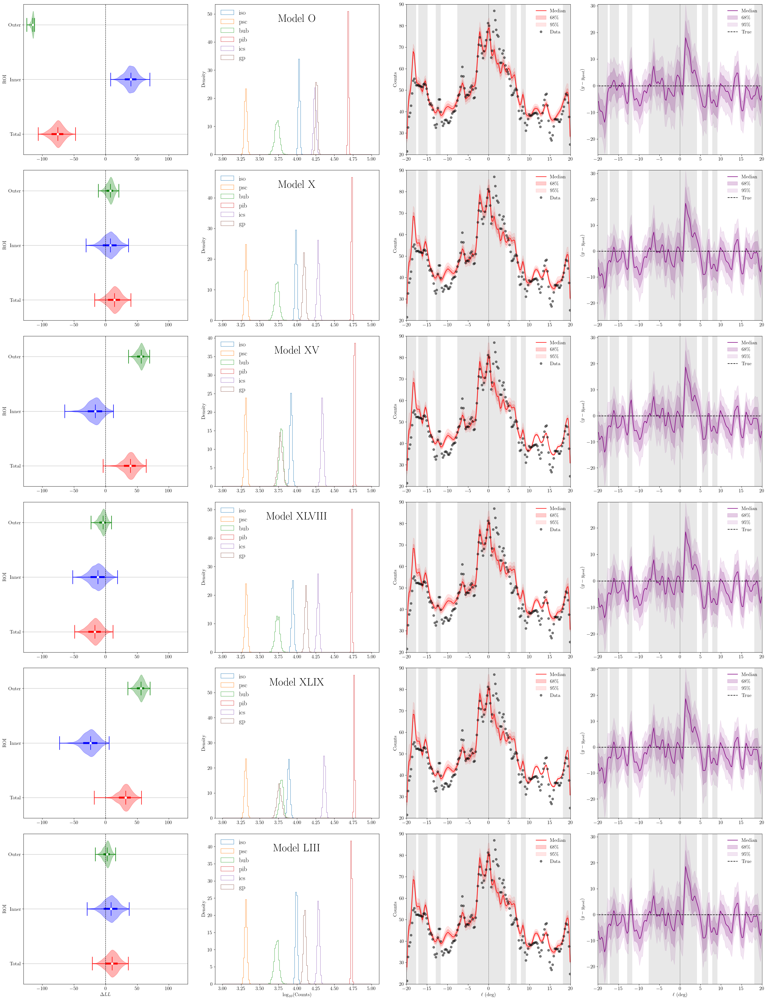

In [14]:
nrows = 6 ; ncols = 4
vmin = -0.7 ; vmax = 1.75

fig, axes = plt.subplots(figsize=(6*5, 6.5*6), dpi= 120, nrows = nrows, ncols = ncols)
for i in range(6):

    # violin plots
    plt.axes(axes[i,0])

    # load data
    all_data = [ll_samples_dict['ll_total'][i], ll_samples_dict['ll_inner'][i], ll_samples_dict['ll_outer'][i]]
    colors = ['red', 'blue', 'green']

    # plot violin plot
    eplt.violin_plot(all_data, colors, ax = axes[i,0])
    plt.xlim(x_range)

    # generate samples and plot histograms of log counts
    plt.axes(axes[i,1])
    temp_sample_dict = temp_sample_dict_list[i]
    ef.tot_log_counts_hist(temp_sample_dict, None, None, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = axes[i,1])
    plt.text(0.5, 0.9, 'Model {}'.format(model_names[i]), horizontalalignment = 'center', verticalalignment = 'center', transform = axes[i,1].transAxes, fontsize = 30)
 
    # plot diagnostic plots
    slice_val = 3.2  # y-value of slice

    # 1d slice of total rate map
    tot_samples_cart = tot_samples_cart_list[i]
    data_residuals_cart = model_residuals_cart_list[i]

    # 1d slice of total rate map
    q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)

    plt.axes(axes[i,2])
    eplt.cart_plot_1d(q, sim_cart = None, raw_cart = raw_cart, 
        slice_val = slice_val, 
        ylim = [20., 90.],
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,)

    # 1d slice of total rate residuals
    q = np.percentile(data_residuals_cart, [2.5,16,50,84,97.5], axis = 0)
    sim_cart = np.zeros((n_pixels,n_pixels))

    plt.axes(axes[i,3])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = None, 
        slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$(y - y_\mathrm{pred})$', q_color = 'purple', line_color = 'k', ls = '--')

# remove x-labels inside plots
for i in range(nrows):
    for j in range(ncols):
        if i != nrows - 1:
            axes[i,j].set_xlabel(None)

fig.tight_layout()
fig.savefig('figures/fig_fit_to_data_summary.pdf', bbox_inches='tight')

### Figure 8

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.060000000000000005, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used 

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(


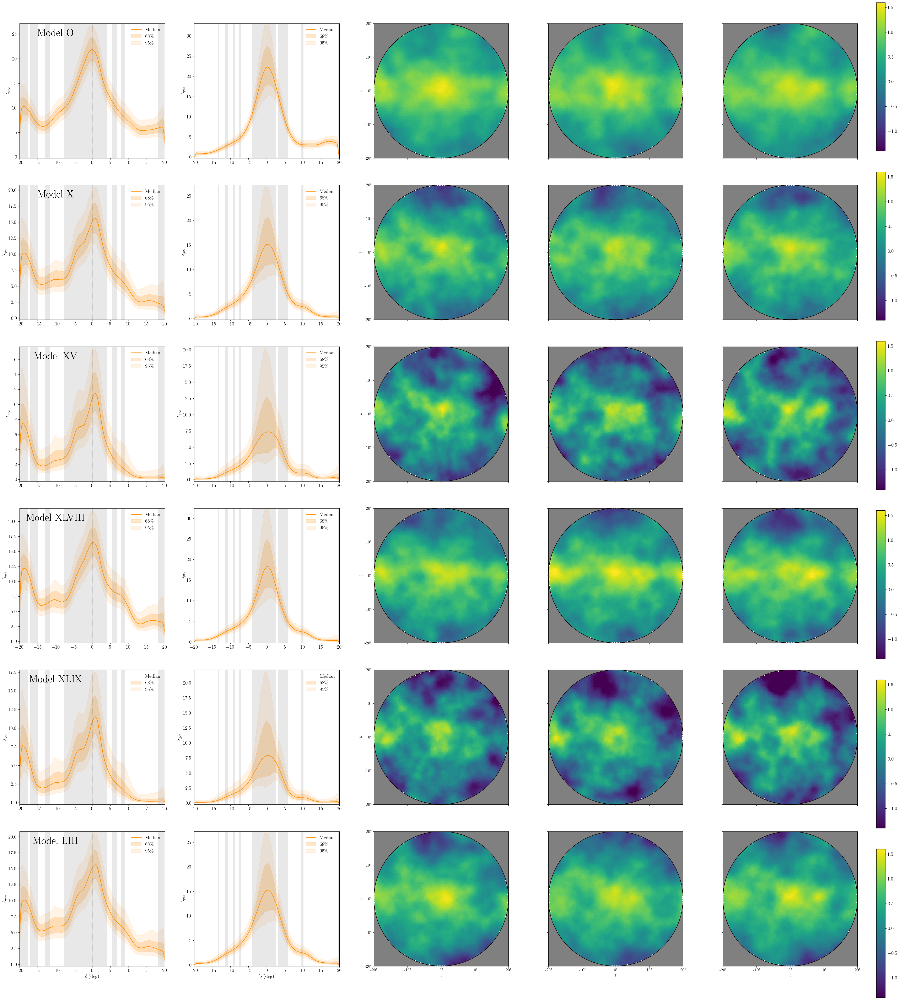

In [15]:
slice_val = 3.2  # y-value of slice

nrows = 6
ncols = 5
sub = (nrows, ncols, 1)
vmin = -1.4 ; vmax = 1.6

# gridspec = {'width_ratios': [1, 1, 1, 1, 1, 0.1]}
fig, axes = plt.subplots(figsize=(6.*nrows, 6*ncols + 12.), dpi= 120, nrows = nrows, ncols = ncols)
fig.subplots_adjust(right=0.8)    
cbar_ax_list = []

for i in range(nrows):
    exp_gp_samples_cart = exp_gp_samples_cart_list[i]
    temp_sample_dict_cmask = temp_sample_dict_cmask_list[i]

    # 1d slice of GCE
    q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles

    plt.axes(axes[i,0], aspect = 'equal')
    eplt.cart_plot_1d(q, sim_cart = None, raw_cart = None, 
        slice_dir = 'horizontal', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')
    sub = sub[:2] + (sub[2] + 1,)
    plt.text(0.25, 0.925, 'Model {}'.format(model_names[i]), horizontalalignment = 'center', verticalalignment = 'center', transform = axes[i,0].transAxes, fontsize = 30)

    plt.axes(axes[i,1], aspect = 'equal')
    eplt.cart_plot_1d(q, sim_cart = None, raw_cart = None, 
        slice_dir = 'vertical', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')
    sub = sub[:2] + (sub[2] + 1,)
    plt.text(0.25, 0.925, 'Model {}'.format(model_names[i]), horizontalalignment = 'center', verticalalignment = 'center', transform = axes[i,0].transAxes, fontsize = 30)

    # set range of vmin and vmax
    # vmin = np.round(np.log10(temp_sample_dict_cmask['gp'][1:ncols]).min(axis = 1).mean(axis = 0), 1)
    # vmax = np.round(np.log10(temp_sample_dict_cmask['gp'][1:ncols].max(axis = 1)).mean(axis = 0), 1)

    idxs = jax.random.randint(jax.random.PRNGKey(53), (nrows, ncols - 1), 0, temp_sample_dict_cmask['gp'].shape[0])
    for j in range(2, ncols):
        idx = idxs[i,j-1] # random idx for GP sampling
        m = ef.convert_masked_array_to_hp_array(temp_sample_dict_cmask['gp'][idx], mask, log_option = True, nside = 128)
        plt.axes(axes[i,j])
        eplt.inner_roi_map(m, title = None, vmin = vmin, vmax = vmax, subplot = sub, 
            display_y_info = False if j != 2 else True,
            display_x_info = False if i != nrows - 1 else True,
            cbar = False,
            xsize = xsize)
        sub = sub[:2] + (sub[2] + 1,)

    # setup the normalization and the colormap
    normalize = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    colormap = mpl.cm.viridis

    # setup the colorbar
    scalarmappaple = mpl.cm.ScalarMappable(norm=normalize, cmap=colormap)
    scalarmappaple.set_array(np.linspace(vmin,vmax,100))
    cbar_ax_list.append(fig.add_axes([0.995, 0.02 + 0.97 * i / 6, 0.01, 0.17 * 5/6]))  # left, bottom, width, height, note we need to offset the bottom of the colorbar to shift up
    fig.colorbar(scalarmappaple, cax=cbar_ax_list[i])

for i in range(nrows):
    for j in range(ncols):
        if i != nrows - 1:
            axes[i,j].set_xlabel(None)

# plt.tight_layout()
fig.savefig('figures/fig_fit_to_data_gp_samples.pdf', bbox_inches='tight')

### Figure 9

In [16]:
# load data
temp_samples_list, temp_svi_results_list = pickle.load(open('data/figdata_9.p', 'rb'))

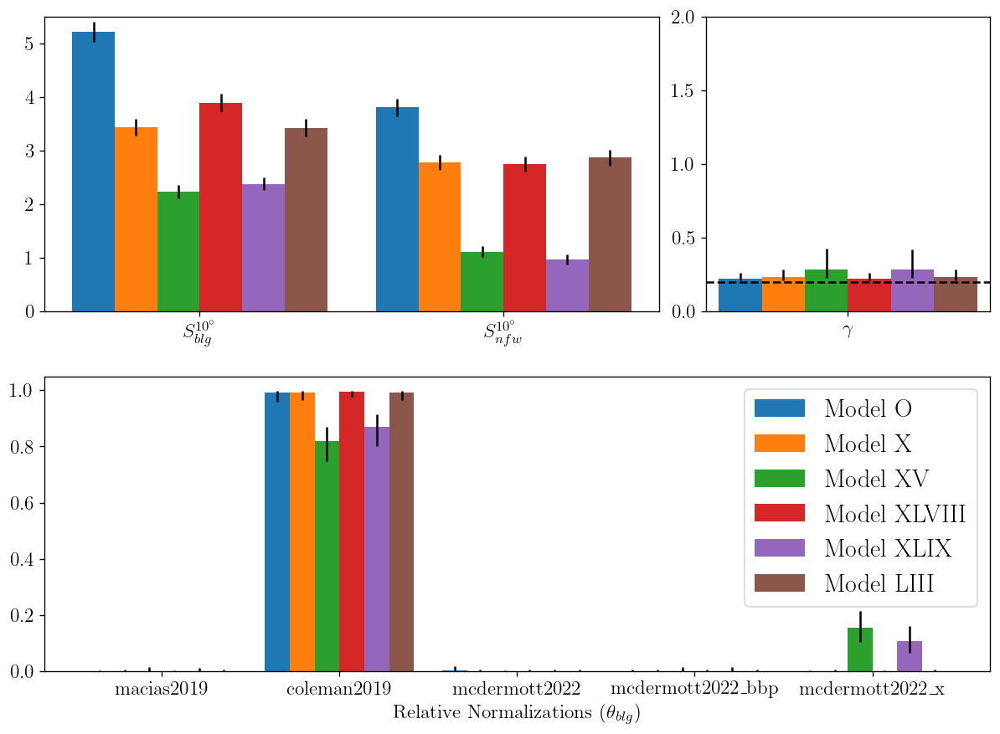

In [17]:
# histogram plots of bulges

# blg id and blg name
blg_ids = np.arange(1,6)
num_blgs = len(blg_ids)
blg_names = [ef.gen_blg_name_(int(blg_ids[j]) - 1)[0] for j in range(len(blg_ids))]

# highlight best models (dif_names ordered from 0 - 79)
roman_nums_arr = [ef.int_to_Roman(i) for i in range(1,80+1)]
best_models_rom = ['X', 'XV', 'XLVIII', 'XLIX', 'LIII']
model_names = ['O'] + best_models_rom
best_models = [roman_nums_arr.index(r) + 1 for r in best_models_rom]

from scipy.special import softmax
fig = plt.figure(figsize=(10,14), dpi= 120)

ax11 = plt.subplot2grid((4, 3), (0, 0), colspan = 2)
num_trials = 6
width = 0.14

rects = []
colors = ['C' + str(i) for i in range(6)]
for n in range(num_trials):
    t = np.linspace(0,1,2)
    ind = np.arange(len(t))

    temp_samples = temp_samples_list[n]
    q_blg = np.quantile(temp_samples['S_blg'], [0.16, 0.5, 0.84])
    q_nfw = np.quantile(temp_samples['S_nfw'], [0.16, 0.5, 0.84])

    rel_norms = np.array([q_blg[1], q_nfw[1]])
    yerr = np.array([[q_blg[1] - q_blg[0], q_nfw[1] - q_nfw[0]], [q_blg[2] - q_blg[1], q_nfw[2] - q_nfw[1]]])

    rects.append(ax11.bar(ind - (num_trials - 1) / 2 * width + n * width , rel_norms, width, yerr = yerr, 
                        color = colors[n], label = 'Dif Model {}'.format(n)))

ax11.set_ylim(0, 5.5)
ax11.set_xticks(ind)
ax11.set_xticklabels(['$S_{blg}^{10^{\circ}}$', '$S_{nfw}^{10^{\circ}}$'])
# ax11.text(0.9, 2., 'Normalizations', fontsize=20, ha='center')

ax12 = plt.subplot2grid((4, 3), (0, 2), colspan = 1)
num_trials = 6
width = 0.14

rects = []
colors = ['C' + str(i) for i in range(6)]
for n in range(num_trials):
    t = np.linspace(0,1,1)
    ind = np.arange(len(t))

    temp_samples = temp_samples_list[n]
    if 'gamma' not in list(temp_samples.keys()):
        q_gamma = np.quantile(np.zeros_like(temp_samples['S_nfw']), [0.16, 0.5, 0.84])
    else:
        q_gamma = np.quantile(temp_samples['gamma'], [0.16, 0.5, 0.84])

    rel_norms = np.array([q_gamma[1]])
    yerr = np.array([[q_gamma[1] - q_gamma[0]], [q_gamma[2] - q_gamma[1]]])

    rects.append(ax12.bar(ind - (num_trials - 1) / 2 * width + n * width , rel_norms, width, yerr = yerr, 
                        color = colors[n], label = 'Dif Model {}'.format(n)))

ax12.set_ylim(0, 2.)
ax12.set_xticks(ind)
ax12.set_xticklabels(['$\\gamma$'])
ax12.axhline(y = 0.2, color = 'k', linestyle = '--')
# ax12.text(0, 1.75, 'NFW Gamma', fontsize=20, ha='center')

ax2 = plt.subplot2grid((4, 3), (1, 0), colspan = 3)
num_trials = 6
width = 0.14

rects = []
colors = ['C' + str(i) for i in range(num_trials)]
for n in range(num_trials):
    t = np.linspace(0,1,num_blgs)
    ind = np.arange(len(t))

    temp_samples = temp_samples_list[n]
    q_rel = np.quantile(temp_samples['theta_blg'], [0.16, 0.5, 0.84], axis = 0)

    rel_norms = [q_rel[1,i] for i in range(num_blgs)]
    yerr = [[q_rel[1,i] - q_rel[0,i] for i in range(num_blgs)], [q_rel[2,i] - q_rel[1,i] for i in range(num_blgs)]]

    rects.append(ax2.bar(ind - (num_trials - 1) / 2 * width + n * width , rel_norms, width, yerr = yerr, 
                        color = colors[n], label = 'Model {}'.format(model_names[n])))

ax2.set_xlabel('Relative Normalizations ($\\theta_{blg}$)')
ax2.set_xticks(ind)
ax2.set_xticklabels(blg_names)
ax2.legend()
# ax2.text(0.55, 0.75, 'Bulge Comparisons', fontsize=24, ha='center')

plt.tight_layout(pad = 0.5)
fig.savefig('figures/fig_fit_to_data_bulge_comparisons.pdf', bbox_inches='tight')

### Figure 10

In [18]:
# load data
temp_samples_list, temp_svi_results_list = pickle.load(open('data/figdata_10.p', 'rb'))

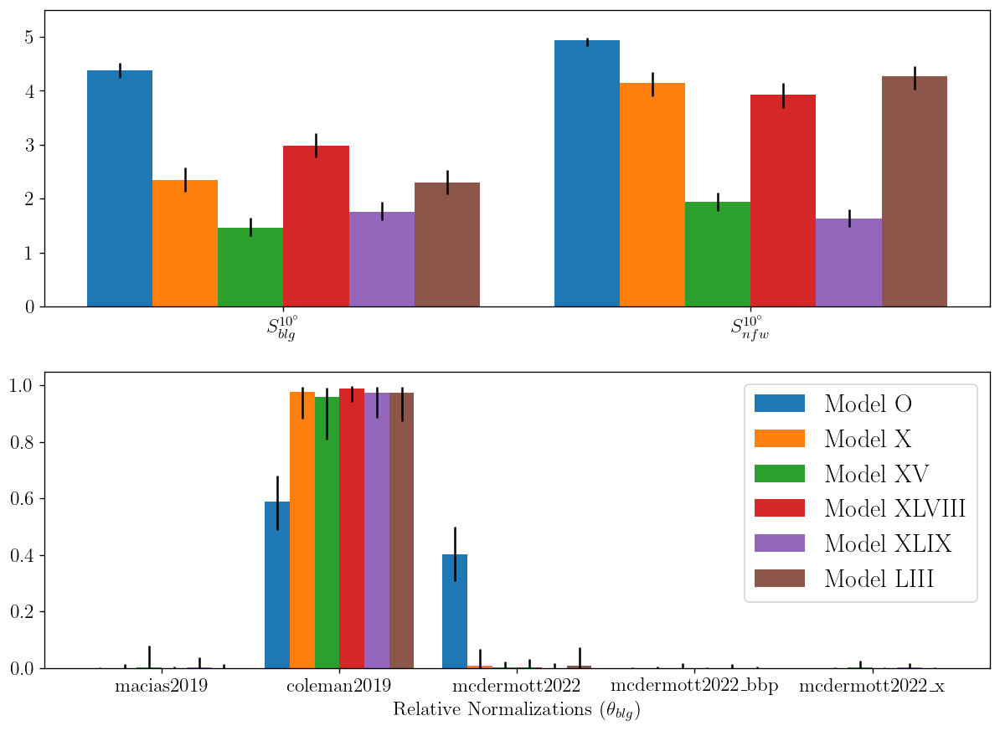

In [19]:
# histogram plots of bulges

# blg id and blg name
blg_ids = np.arange(1,6)
num_blgs = len(blg_ids)
blg_names = [ef.gen_blg_name_(int(blg_ids[j]) - 1)[0] for j in range(len(blg_ids))]

from scipy.special import softmax
fig = plt.figure(figsize=(10,14), dpi= 120)

ax11 = plt.subplot2grid((4, 2), (0, 0), colspan = 2)
num_trials = 6
width = 0.14

rects = []
colors = ['C' + str(i) for i in range(6)]
for n in range(num_trials):
    t = np.linspace(0,1,2)
    ind = np.arange(len(t))

    temp_samples = temp_samples_list[n]
    q_blg = np.quantile(temp_samples['S_blg'], [0.16, 0.5, 0.84])
    q_nfw = np.quantile(temp_samples['S_nfw'], [0.16, 0.5, 0.84])

    rel_norms = np.array([q_blg[1], q_nfw[1]])
    yerr = np.array([[q_blg[1] - q_blg[0], q_nfw[1] - q_nfw[0]], [q_blg[2] - q_blg[1], q_nfw[2] - q_nfw[1]]])

    rects.append(ax11.bar(ind - (num_trials - 1) / 2 * width + n * width , rel_norms, width, yerr = yerr, 
                        color = colors[n], label = 'Dif Model {}'.format(n)))

ax11.set_ylim(0, 5.5)
ax11.set_xticks(ind)
ax11.set_xticklabels(['$S_{blg}^{10^{\circ}}$', '$S_{nfw}^{10^{\circ}}$'])
# ax11.text(0.9, 2., 'Normalizations', fontsize=20, ha='center')

ax2 = plt.subplot2grid((4, 2), (1, 0), colspan = 2)
num_trials = 6
width = 0.14

rects = []
colors = ['C' + str(i) for i in range(num_trials)]
for n in range(num_trials):
    t = np.linspace(0,1,num_blgs)
    ind = np.arange(len(t))

    temp_samples = temp_samples_list[n]
    q_rel = np.quantile(temp_samples['theta_blg'], [0.16, 0.5, 0.84], axis = 0)

    rel_norms = [q_rel[1,i] for i in range(num_blgs)]
    yerr = [[q_rel[1,i] - q_rel[0,i] for i in range(num_blgs)], [q_rel[2,i] - q_rel[1,i] for i in range(num_blgs)]]

    rects.append(ax2.bar(ind - (num_trials - 1) / 2 * width + n * width , rel_norms, width, yerr = yerr, 
                        color = colors[n], label = 'Model {}'.format(model_names[n])))

ax2.set_xlabel('Relative Normalizations ($\\theta_{blg}$)')
ax2.set_xticks(ind)
ax2.set_xticklabels(blg_names)
ax2.legend()
# ax2.text(0.55, 0.75, 'Bulge Comparisons', fontsize=24, ha='center')

plt.tight_layout(pad = 0.5)
fig.savefig('figures/fig_fit_to_data_bulge_comparisons_gamma_1p2.pdf', bbox_inches='tight')

### Figure 10.5 (Actually 11)

In [20]:
# load data
samples_dict, temp_sample_dict, temp_sample_dict_cmask = pickle.load(open('data/figdata_10p5.p', 'rb'))

/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

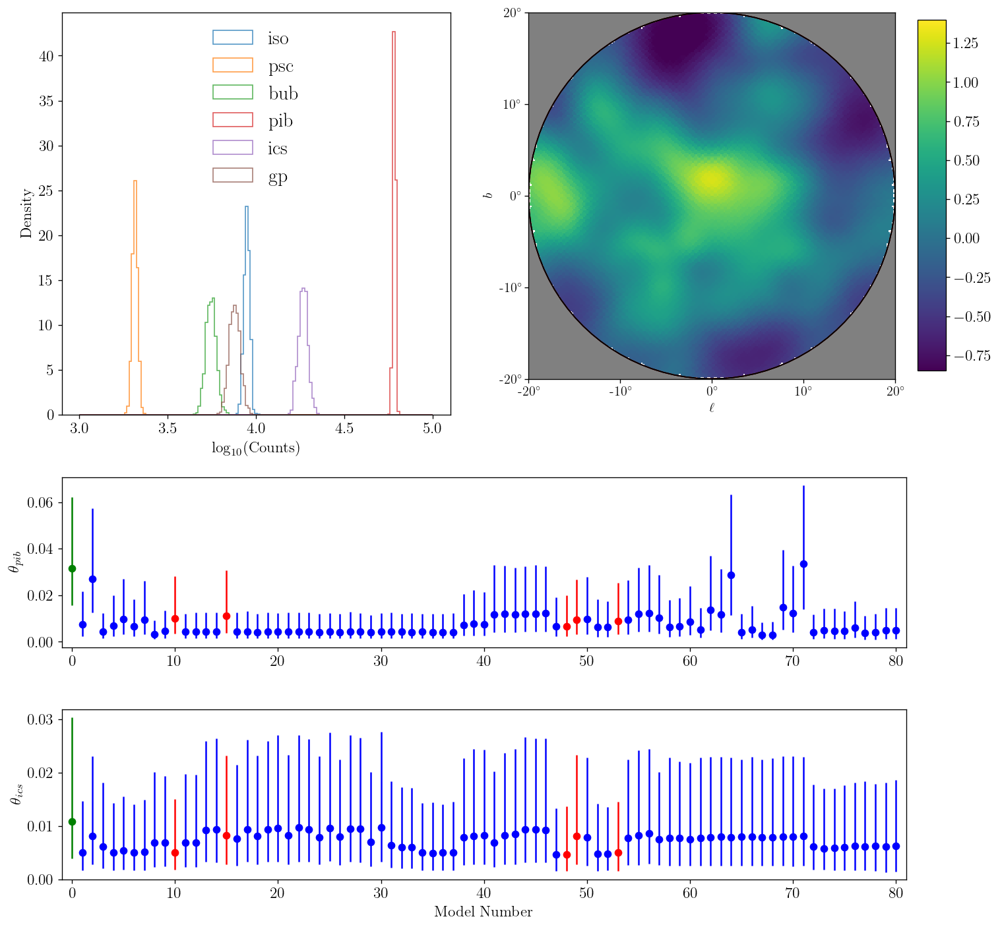

In [21]:
vmin = -0.85 ; vmax = 1.4

fig = plt.figure(figsize=(12,12), dpi= 120)

ax11 = plt.subplot2grid((4, 2), (0, 0), rowspan = 2)
ax12 = plt.subplot2grid((4, 2), (0, 1), rowspan = 2)
ax2 = plt.subplot2grid((4, 2), (2, 0), colspan = 2)
ax3 = plt.subplot2grid((4, 2), (3, 0), colspan = 2)

plt.axes(ax11)
ef.tot_log_counts_hist(temp_sample_dict, None, None, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = ax11)

q = np.percentile(temp_sample_dict_cmask['gp'], 50, axis = 0)
m = ef.convert_masked_array_to_hp_array(q, mask, log_option = True, nside = 128)
plt.axes(ax12)
eplt.inner_roi_map(m, title = None, vmin = vmin, vmax = vmax, subplot = 222, cbar = False)

# setup the normalization and the colormap
normalize = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
colormap = mpl.cm.viridis

# setup the colorbar
scalarmappaple = mpl.cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(np.linspace(vmin,vmax,100))
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.98, 0.6, 0.03, 0.37])  # left, bottom, width, height
fig.colorbar(scalarmappaple, cax=cbar_ax)

plt.axes(ax2)
q = np.quantile(samples_dict['theta_pib'], [0.16, 0.5, 0.84], axis = 0)
eplt.rel_norm_comparisons_all(q, include_model_o = True)
plt.ylabel('$\\theta_{pib}$')
plt.xlim(-1, 81)

plt.axes(ax3)
q = np.quantile(samples_dict['theta_ics'], [0.16, 0.5, 0.84], axis = 0)
eplt.rel_norm_comparisons_all(q, include_model_o = True)
plt.xlabel('Model Number')
plt.ylabel('$\\theta_{ics}$')
plt.xlim(-1, 81)

plt.tight_layout()
fig.savefig('figures/fig_fit_to_data_all_models.pdf', bbox_inches='tight')

### Figure 11 (12)
`src: /data/edr76/gce-gp/notebooks/1d-5-gp2temp_inner_5_best_mods copy.ipynb`

In [22]:
# load data
temp_samples, temp_sample_dict_cmask, blg_list = pickle.load(open('data/figdata_11.p', 'rb'))

# load cartesian data
mask_map_cart, exp_gp_samples_cart, nfw_cart, blg_cart, blg_pieces_cart = pickle.load(open('data/figdata_11_cart.p', 'rb'))

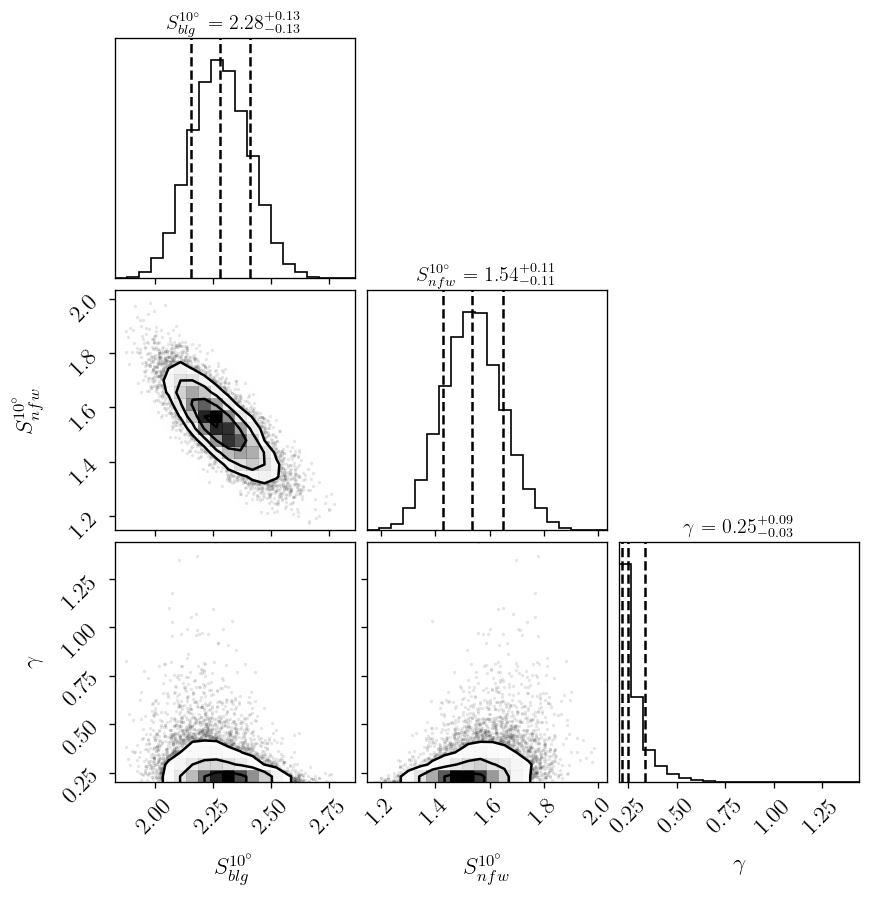

In [23]:
keys = list(temp_samples.keys())

temp_samples_tot_list = []
for k in keys:
    if k not in ['S_nfw', 'S_blg', 'gamma']:
        continue
    else:
        temp_samples_tot_list.append(temp_samples[k])
temp_samples_tot_list = np.array(temp_samples_tot_list)

labels = ef.gen_labels(keys, num_theta = len(blg_list))
labels[0] = '$S_{blg}^{10^{\circ}}$' ; labels[1] = '$S_{nfw}^{10^{\circ}}$' ; labels[2] = '$\\gamma$'
fig = corner.corner(temp_samples_tot_list.T, labels = labels, quantiles=[0.16, 0.5, 0.84], show_titles=True, title_kwargs={"fontsize": 12})
fig.savefig('figures/fig_alltemps_corner.svg', bbox_inches='tight')

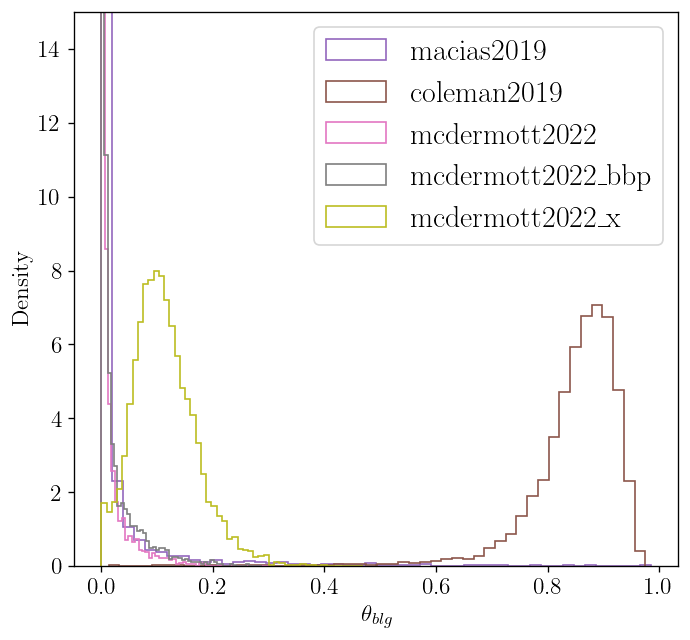

In [24]:
fig = plt.figure(figsize=(6.5, 6), dpi= 120)
for n in range(temp_samples['theta_blg'].shape[1]):
    plt.hist(temp_samples['theta_blg'][:,n], bins = 50, histtype = 'step', color = 'C' + str(n + 4), density = True, label = ef.gen_blg_name_(n)[0])
plt.xlabel('$\\theta_{blg}$')
plt.ylabel('Density')
plt.legend()
plt.ylim(0, 15)
plt.savefig('figures/fig_theta_blg_hist.svg', bbox_inches='tight')

Slice at y = 3.37500 deg


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Slice at x = 3.37500 deg


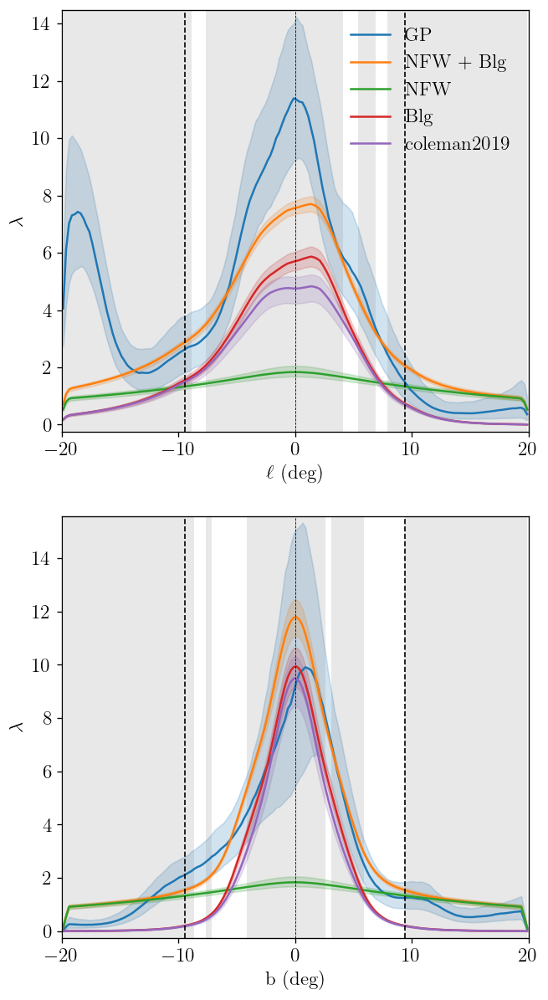

In [25]:
fig, axes = plt.subplots(figsize=(6, 12), dpi= 120, nrows = 2, ncols = 1)
slice_val = 3.2
# 1d slice of GCE

q_list = []
q_list.append(np.percentile(exp_gp_samples_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(blg_cart + nfw_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(nfw_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(blg_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
idx = np.argmax(temp_samples['theta_blg'].mean(axis = 0))
q_list.append(np.percentile(blg_pieces_cart[idx], [16,50,84], axis = 0)) # cartesian sample map quantiles
# [q_list.append(np.percentile(blg_pieces_cart[i], [16,50,84], axis = 0)) for i in range(len(blg_pieces_cart))] # cartesian sample map quantiles

q_labels = ['GP', 'NFW + Blg', 'NFW', 'Blg', ef.gen_blg_name_(idx)[0]]
q_colors = ['C' + str(i) for i in range(len(q_list))]

plt.axes(axes[0])
eplt.cart_plot_1d_multi(q_list,
    slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda$', q_colors = q_colors, line_color = 'green', q_labels = q_labels,
    )
plt.axvline(np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.axvline(-np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)

slice_val = 3.2

q_labels = [None, None, None, None, None]
q_colors = ['C' + str(i) for i in range(len(q_list))]

plt.axes(axes[1])
eplt.cart_plot_1d_multi(q_list, 
    slice_dir = 'vertical', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda$', q_colors = q_colors, line_color = 'green', q_labels = q_labels,
    )
plt.axvline(np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.axvline(-np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.savefig('figures/fig_alltemps_slices.svg', bbox_inches='tight')

### Figure 12 (13)
`src: /data/edr76/gce-gp/nfw_priors/1d2-5-gp2temp_inner_5_best_mods copy.ipynb`

In [26]:
# load data
temp_samples, temp_sample_dict_cmask, blg_list = pickle.load(open('data/figdata_12.p', 'rb'))

# load cartesian data
mask_map_cart, exp_gp_samples_cart, nfw_cart, blg_cart, blg_pieces_cart = pickle.load(open('data/figdata_12_cart.p', 'rb'))

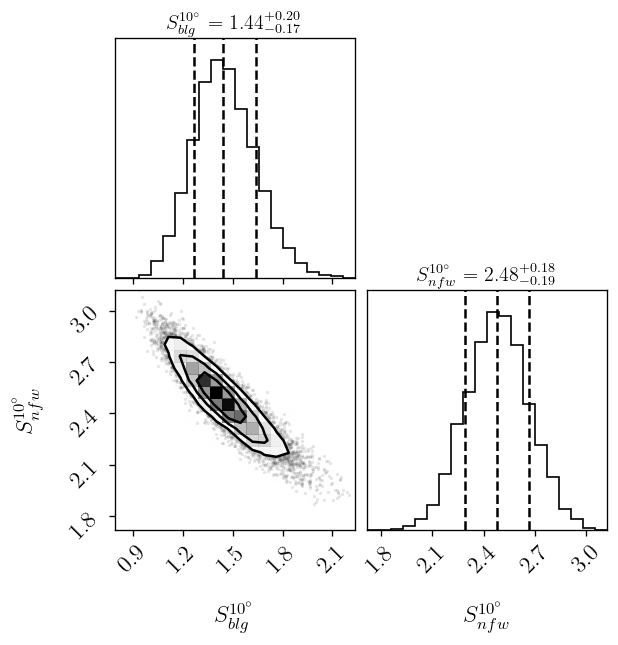

In [27]:
keys = list(temp_samples.keys())

temp_samples_tot_list = []
for k in keys:
    if k not in ['S_nfw', 'S_blg', 'gamma']:
        continue
    else:
        temp_samples_tot_list.append(temp_samples[k])
temp_samples_tot_list = np.array(temp_samples_tot_list)

labels = ef.gen_labels(keys, num_theta = len(blg_list))
labels[0] = '$S_{blg}^{10^{\circ}}$' ; labels[1] = '$S_{nfw}^{10^{\circ}}$'
fig = corner.corner(temp_samples_tot_list.T, labels = labels, quantiles=[0.16, 0.5, 0.84], show_titles=True, title_kwargs={"fontsize": 12})
fig.savefig('figures/fig_alltemps_corner_gamma_1p2.svg', bbox_inches='tight')

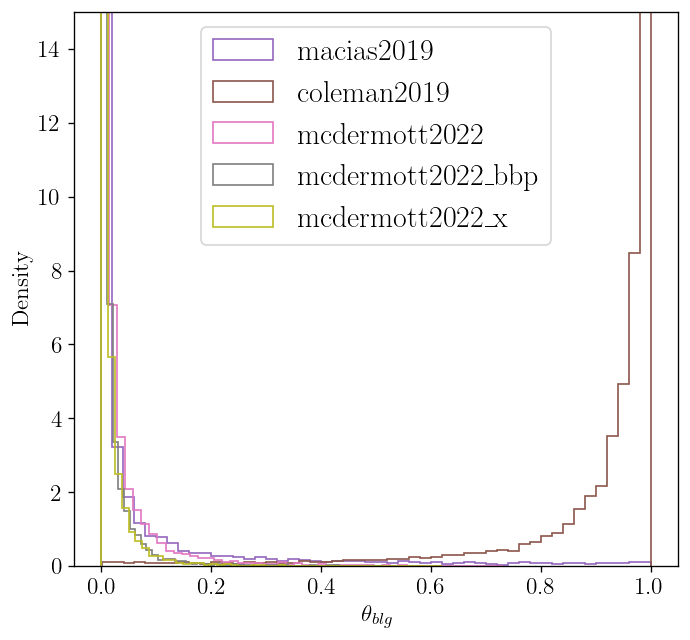

In [28]:
fig = plt.figure(figsize=(6.5, 6), dpi= 120)
for n in range(temp_samples['theta_blg'].shape[1]):
    plt.hist(temp_samples['theta_blg'][:,n], bins = 50, histtype = 'step', color = 'C' + str(n + 4), density = True, label = ef.gen_blg_name_(n)[0])
plt.xlabel('$\\theta_{blg}$')
plt.ylabel('Density')
plt.legend()
plt.ylim(0, 15)
plt.savefig('figures/fig_theta_blg_hist_gamma_1p2.svg', bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


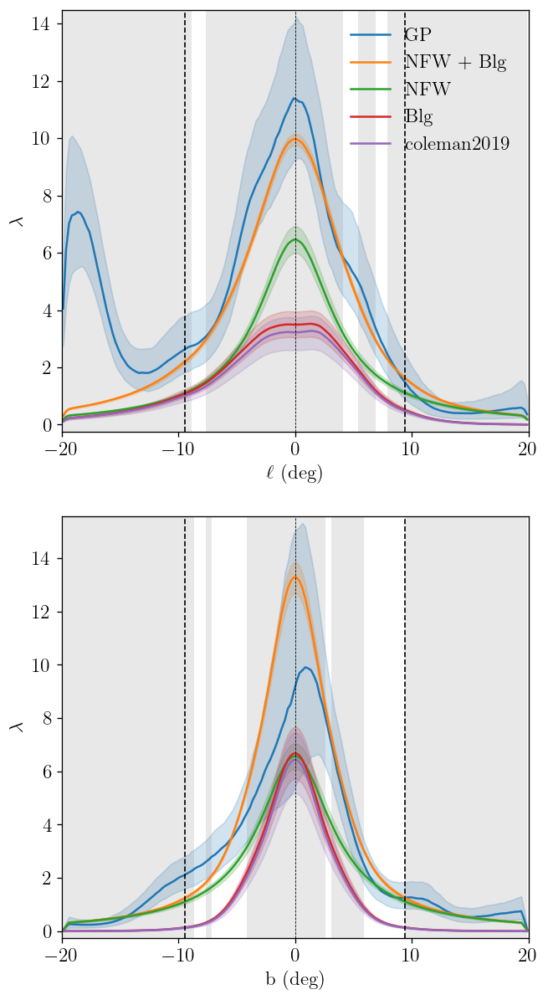

In [29]:
fig, axes = plt.subplots(figsize=(6, 12), dpi= 120, nrows = 2, ncols = 1)
slice_val = 3.2
# 1d slice of GCE

q_list = []
q_list.append(np.percentile(exp_gp_samples_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(blg_cart + nfw_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(nfw_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
q_list.append(np.percentile(blg_cart, [16,50,84], axis = 0)) # cartesian sample map quantiles
idx = np.argmax(temp_samples['theta_blg'].mean(axis = 0))
q_list.append(np.percentile(blg_pieces_cart[idx], [16,50,84], axis = 0)) # cartesian sample map quantiles
# [q_list.append(np.percentile(blg_pieces_cart[i], [16,50,84], axis = 0)) for i in range(len(blg_pieces_cart))] # cartesian sample map quantiles

q_labels = ['GP', 'NFW + Blg', 'NFW', 'Blg', ef.gen_blg_name_(idx)[0]]
q_colors = ['C' + str(i) for i in range(len(q_list))]

plt.axes(axes[0])
eplt.cart_plot_1d_multi(q_list,
    slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda$', q_colors = q_colors, line_color = 'green', q_labels = q_labels,
    )
plt.axvline(np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.axvline(-np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)

slice_val = 3.2

q_labels = [None, None, None, None, None]
q_colors = ['C' + str(i) for i in range(len(q_list))]

plt.axes(axes[1])
eplt.cart_plot_1d_multi(q_list, 
    slice_dir = 'vertical', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda$', q_colors = q_colors, line_color = 'green', q_labels = q_labels,
    )
plt.axvline(np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.axvline(-np.sqrt(10.**2. - 3.375**2.), c = 'k', ls = '--', lw = 1)
plt.savefig('figures/fig_alltemps_slices_gamma1p2.svg', bbox_inches='tight')